In [1]:
import numpy as np
import pickle
from matplotlib import pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

# from torchvision.models.feature_extraction import get_graph_node_names
# from torchvision.models.feature_extraction import create_feature_extractor

from scipy.ndimage import gaussian_filter1d as smooth
from scipy.stats import kendalltau as tau
from scipy.stats import pearsonr as p
from scipy.stats import spearmanr as r
from tqdm.notebook import tqdm

sns.set_palette('Set1')

# Functions

In [2]:
def hist_equalize(matrix):
    matrix = np.copy(matrix)
    shape = matrix.shape
    matrix = matrix.reshape(-1)
    index = matrix.argsort()
    values = np.linspace(0, 1, index.shape[0])
    matrix[index] = values
    return matrix.reshape(shape)

def mkrdm(data):
    rdmat = 1 - cosine_similarity(data)
    return rdmat

def mkherdm(data):
    rdmat = 1 - cosine_similarity(data)
    return hist_equalize(rdmat)

In [3]:
def get_mdl_rdm(attr, info):
    
    validStimuliIndex = ((info.cat != 'none') & ((info.sfr == "A") | (info.sfr == "BI"))).to_numpy()
    info = info[validStimuliIndex].reset_index(drop=True)

    argsort = np.argsort(
        info.con.astype('category').cat.set_categories(
            ['human face', 'monkey face', 'human body', 'monkey body', 'artificial', 'natural'], 
            ordered=True
        )
    )

    rdm = {}
    for key in attr.keys():
        repr = attr[key][validStimuliIndex, :]

        rdmat = mkrdm(repr[argsort, :])
        herdmat = mkherdm(repr[argsort, :])

        rdm[key] = {'raw': rdmat, 'histeq': herdmat}
    
    return rdm

In [4]:
def visualize_mdl_rdm(mdl_rdm):
    cm = 1/2.54
    n = len(mdl_rdm.keys())
    fig, axes = plt.subplots(1, n, figsize=(3*n*cm, 4*cm), dpi=200)

    for ax, layer in zip(axes.flat, mdl_rdm.keys()):
        ax.imshow(mdl_rdm[layer]['histeq'])
        ax.set_title(layer, fontsize=5)
        ax.axis('off')

In [5]:
with open("../utils/info.pkl", "rb") as handler:
    info = pickle.load(handler)
info = info[:165]

# Data RDMs

In [6]:
def movavg(inp, bl, ss):
    nbin = int(np.floor((inp.shape[2] - bl) / ss))
    out = np.nan * np.zeros((inp.shape[0], inp.shape[1], nbin))
    for ibin in range(nbin):
        out[:, :, ibin] = np.sum(inp[:, :, int(ibin*ss):int(ibin*ss)+bl], 2) / bl * 1000
    return out

itc = movavg(np.load('G:\Data\Fast\Both\ITCNoAvg.npy'), 50, 1)
pfc = movavg(np.load('G:\Data\Fast\Both\PFCNoAvg.npy'), 50, 1)

In [7]:
data_rdm = {}
for region, attr in zip(['itc', 'pfc'], [itc, pfc]):
    validStimuliIndex = ((info.cat != 'none') & ((info.sfr == "A") | (info.sfr == "BI"))).to_numpy()
    attr = attr[validStimuliIndex, :]
    info_ = info[validStimuliIndex].reset_index(drop=True)

    argsort = np.argsort(
        info_.con.astype('category').cat.set_categories(
            ['human face', 'monkey face', 'human body', 'monkey body', 'artificial', 'natural'], 
            ordered=True
        )
    )
    rdmat = np.nan * np.ones([argsort.size, argsort.size, attr.shape[2]])
    herdmat = np.nan * np.ones([argsort.size, argsort.size, attr.shape[2]])

    for itime in range(attr.shape[2]):
        rdmat[:,:,itime] = mkrdm(attr[argsort, :, itime])
        herdmat[:,:,itime] = mkherdm(attr[argsort, :, itime])

    data_rdm[region] = {'raw': rdmat, 'histeq': herdmat}

# Derive Representations

In [17]:
import torch
import torchvision

from PIL import Image
from tqdm import tqdm
from glob import glob
import os

from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor

## Inception-V3

In [ ]:
from torchvision.models import inception_v3

mdl = inception_v3(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

In [221]:
return_nodes = {
    # node_name: user-specified key for output dict
    'maxpool1': 'layer2',
    'maxpool2': 'layer3',
    'Mixed_5d.cat': 'layer4',
    'Mixed_6e.cat': 'layer5',
    'avgpool': 'layer6'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [241]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('inception-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

  0%|          | 0/165 [00:00<?, ?it/s]

## EfficientNet

In [297]:
from torchvision.models import efficientnet_b1

mdl = efficientnet_b1(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

Downloading: "https://download.pytorch.org/models/efficientnet_b1_rwightman-533bc792.pth" to C:\Users\User/.cache\torch\hub\checkpoints\efficientnet_b1_rwightman-533bc792.pth
100%|██████████| 30.1M/30.1M [00:22<00:00, 1.39MB/s]


In [299]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.1.1.add': 'layer1',
    'features.2.2.add': 'layer2',
    'features.3.2.add': 'layer3',
    'features.4.3.add': 'layer4',
    'features.5.3.add': 'layer5',
    'features.6.4.add': 'layer6',
    'features.7.1.add': 'layer7',
    'avgpool': 'layer8'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [300]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('effnetb1-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

  0%|          | 0/165 [00:00<?, ?it/s]

## ResNet50

In [302]:
from torchvision.models import resnet50

mdl = resnet50(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

In [304]:
return_nodes = {
    # node_name: user-specified key for output dict
    'layer1.2.relu_2': 'layer1',
    'layer2.3.relu_2': 'layer2',
    'layer3.5.relu_2': 'layer3',
    'layer4.2.relu_2': 'layer4',
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [305]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('resnet50-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

  0%|          | 0/165 [00:00<?, ?it/s]

## VGG16

In [310]:
from torchvision.models import vgg16

mdl = vgg16(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

In [312]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.4':  'layer1',
    'features.9':  'layer2',
    'features.16': 'layer3',
    'features.23': 'layer4',
    'features.30': 'layer5'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [313]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('vgg16-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

  0%|          | 0/165 [00:00<?, ?it/s]

## VGG19

In [60]:
from torchvision.models import vgg19

mdl = vgg19(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to C:\Users\User/.cache\torch\hub\checkpoints\vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [06:29<00:00, 1.48MB/s] 


In [63]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.4':  'layer1',
    'features.9':  'layer2',
    'features.18': 'layer3',
    'features.27': 'layer4',
    'features.36': 'layer5'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [64]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('vgg19-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

100%|██████████| 165/165 [00:30<00:00,  5.34it/s]


## DenseNet

In [21]:
from torchvision.models import densenet201

mdl = densenet201(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to C:\Users\User/.cache\torch\hub\checkpoints\densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:57<00:00, 1.40MB/s]


In [24]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.transition1.pool':  'layer1',
    'features.transition2.pool':  'layer2',
    'features.transition3.pool': 'layer3',
    'flatten': 'layer4',
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [27]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('densenet201-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

100%|██████████| 165/165 [00:25<00:00,  6.47it/s]


## AlexNet

In [ ]:
from torchvision.models import alexnet

mdl = alexnet(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

In [ ]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.1':  'layer2',
    'features.4': 'layer3',
    'features.7': 'layer4',
    'features.9': 'layer5',
    'features.12': 'layer6'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [ ]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('alexnet-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

100%|██████████| 165/165 [00:04<00:00, 39.57it/s]


## SqueezeNet

In [29]:
from torchvision.models import squeezenet1_1

mdl = squeezenet1_1(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to C:\Users\User/.cache\torch\hub\checkpoints\squeezenet1_1-b8a52dc0.pth
100%|██████████| 4.73M/4.73M [00:03<00:00, 1.48MB/s]


In [33]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.0':  'layer1',
    'features.1': 'layer2',
    'features.2': 'layer3',
    'features.3.cat': 'layer4',
    'features.4.cat': 'layer5',
    'features.5': 'layer6',
    'features.6.cat': 'layer7',
    'features.7.cat': 'layer8',
    'features.8': 'layer9',
    'features.9.cat': 'layer10',
    'features.10.cat': 'layer11',
    'features.11.cat': 'layer12',
    'features.12.cat': 'layer13'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [35]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('squeezenet-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

100%|██████████| 165/165 [00:03<00:00, 44.42it/s]


# MobileNet

In [43]:
from torchvision.models import mobilenet_v3_large

mdl = mobilenet_v3_large(pretrained=True, progress=True)
mdl.eval()

train_nodes, eval_nodes = get_graph_node_names(mdl)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to C:\Users\User/.cache\torch\hub\checkpoints\mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:14<00:00, 1.48MB/s]


In [45]:
return_nodes = {
    # node_name: user-specified key for output dict
    'features.0.2':  'layer1',
    'features.1.add': 'layer2',
    'features.2.block.2.1': 'layer3',
    'features.3.add': 'layer4',
    'features.4.block.3.1': 'layer5',
    'features.5.add': 'layer6',
    'features.6.add': 'layer7',
    'features.7.block.2.1': 'layer8',
    'features.8.add': 'layer9',
    'features.9.add': 'layer10',
    'features.10.add': 'layer11',
    'features.11.block.3.1': 'layer12',
    'features.12.add': 'layer13',
    'features.13.block.3.1': 'layer13',
    'features.14.add': 'layer14',
    'features.15.add': 'layer15',
    'features.16.2': 'layer16'
}

fex = create_feature_extractor(mdl, return_nodes=return_nodes)

In [46]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    normalize,
    ])

fnames = sorted(glob(os.path.join('G:\Stimulus', '*.*')))[:165]

attr = {}
with torch.no_grad():
    for fn in tqdm(fnames):
        im = Image.open(fn).convert('RGB')

        out = fex(transform(im).unsqueeze(0))
        for layer in out.keys():
            rep = out[layer].cpu().detach().numpy().flatten()
            if layer not in attr.keys():
                attr[layer] = []
            
            attr[layer].append(rep)

for key in attr.keys():
    attr[key] = np.array(attr[key])

with open('mobilenet-v3-large-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)

100%|██████████| 165/165 [00:04<00:00, 33.00it/s]


# Visualize RDMs

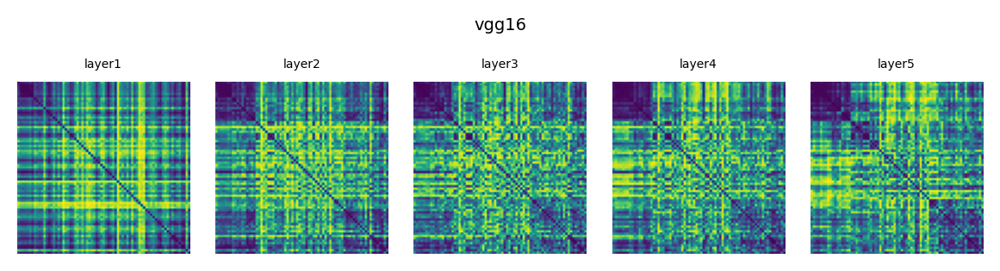

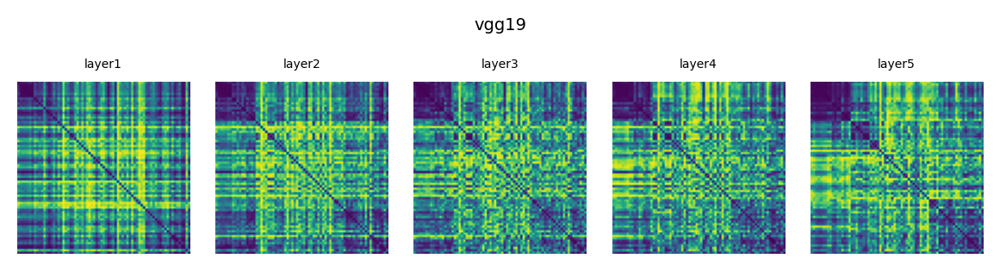

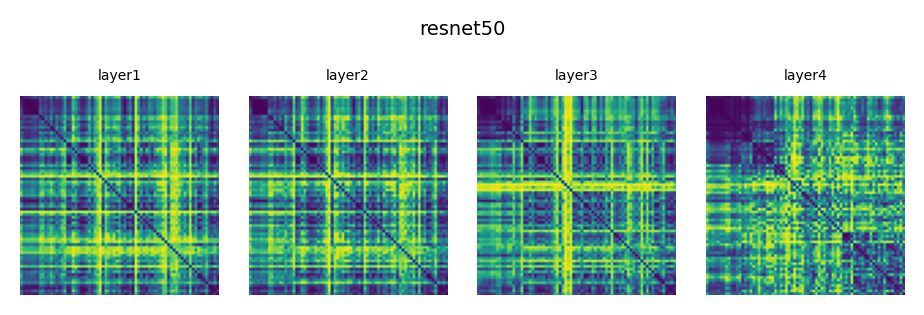

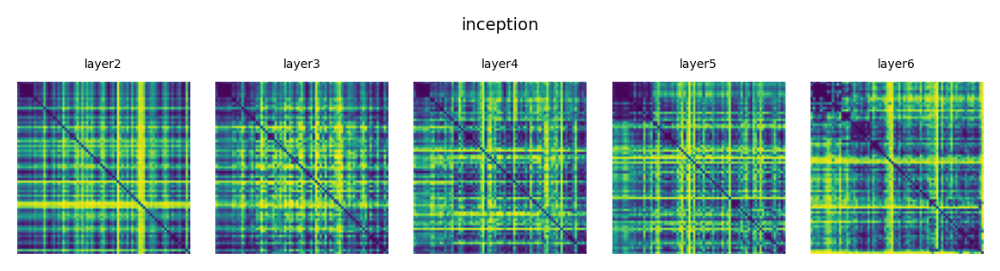

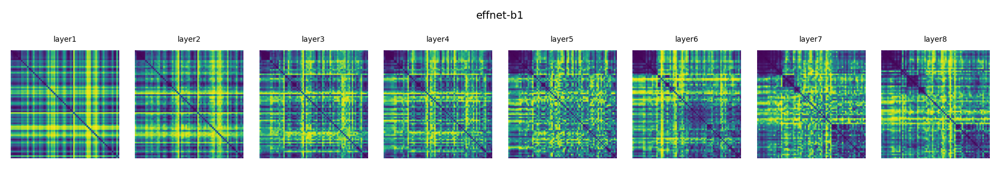

...

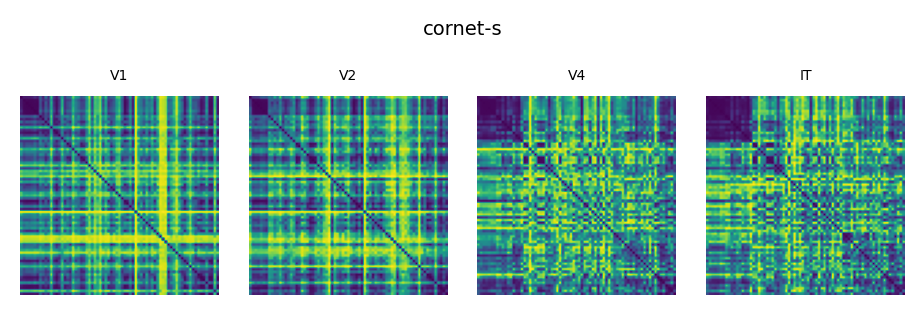

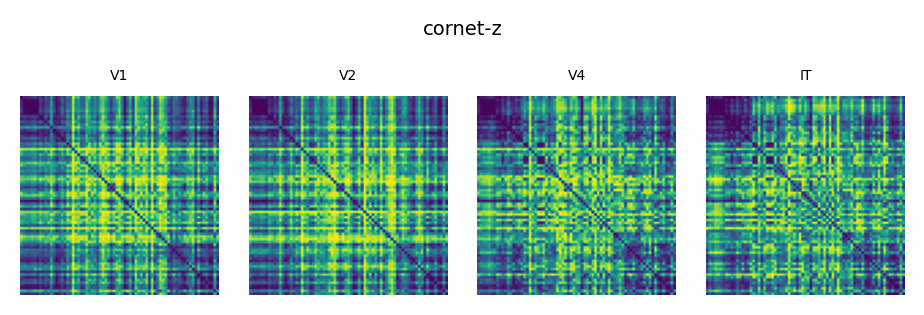

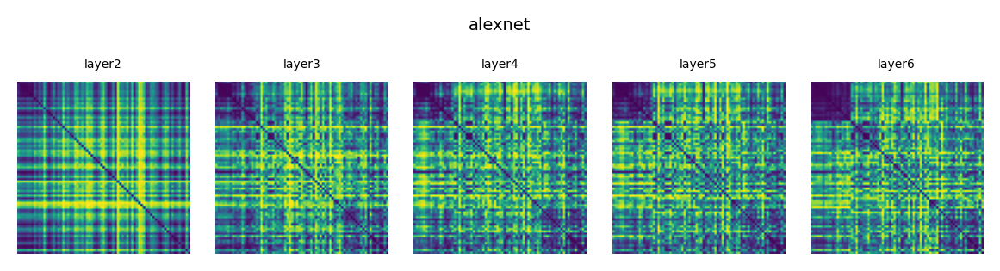

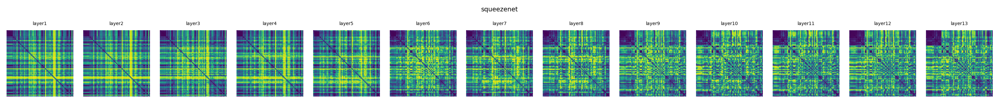

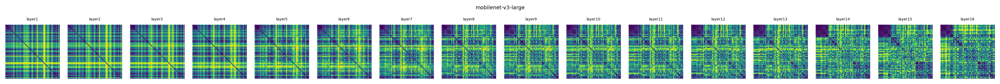

In [7]:
all_models = ['vgg16', 'vgg19', 'resnet50', 'inception', 'effnet-b1', 'densenet201', 
              'cornet-rt', 'cornet-s', 'cornet-z', 'alexnet', 'squeezenet', 'mobilenet-v3-large']
for model in all_models:
    with open(f'{model}-attr.pkl', 'rb') as f:
        attr = pickle.load(f)
    mdl_rdm = get_mdl_rdm(attr, info)

    visualize_mdl_rdm(mdl_rdm=mdl_rdm)
    plt.suptitle(model, fontsize=7)
    plt.tight_layout();

# Data-Model Correlation (RSA)

## Pearson

In [39]:
for model in ['vgg16', 'resnet50', 'inception', 'effnet-b1', 'densenet201']:
    print(model)
    with open(f'{model}-attr.pkl', 'rb') as f:
        attr = pickle.load(f)
    mdl_rdm = get_mdl_rdm(attr, info)
    corr = {'itc': {}, 'pfc': {}}

    for region in ['itc', 'pfc']:
        for layer in attr.keys():
            if layer not in corr[region].keys():
                corr[region][layer] = []
            if layer+"-null" not in corr[region].keys():
                corr[region][layer+"-null"] = []

            X = data_rdm[region]['raw']
            y = mdl_rdm[layer]['raw']

            for time in range(X.shape[2]):
                corr[region][layer].append(p(X[:, :, time].flatten(), y.flatten())[0])
            corr[region][layer] = np.array(corr[region][layer])

            for ishuffle in range(100):
                np.random.seed(ishuffle)
                shufind = np.random.permutation(X.shape[0]).flatten()
                X = X[shufind][:, shufind]
                _s = []
                for time in range(X.shape[2]):
                    _s.append(p(X[:, :, time].flatten(), y.flatten())[0])
                corr[region][layer+"-null"].append(_s)
            corr[region][layer+"-null"] = np.array(corr[region][layer+"-null"])
        
    with open(f'{model}-pearson.pkl', 'wb') as f:
        pickle.dump(corr, f)    

vgg16
resnet50
inception
effnet-b1
densenet201


## Spearman

In [68]:
# for model in all_models:
for model in ['vgg19']:
    print(model)
    with open(f'{model}-attr.pkl', 'rb') as f:
        attr = pickle.load(f)
    mdl_rdm = get_mdl_rdm(attr, info)
    corr = {'itc': {}, 'pfc': {}}

    for region in ['itc', 'pfc']:
        for layer in attr.keys():
            if layer not in corr[region].keys():
                corr[region][layer] = []

            X = data_rdm[region]['raw']
            y = mdl_rdm[layer]['raw']

            for time in range(X.shape[2]):
                corr[region][layer].append(r(X[:, :, time].flatten(), y.flatten())[0])
            corr[region][layer] = np.array(corr[region][layer])
        
    with open(f'{model}-spearman.pkl', 'wb') as f:
        pickle.dump(corr, f)    

vgg19


## Kendall's Tau

In [50]:
for model in ['vgg16', 'resnet50', 'inception', 'effnet-b1', 'densenet201']:
    print(model)
    with open(f'{model}-attr.pkl', 'rb') as f:
        attr = pickle.load(f)
    mdl_rdm = get_mdl_rdm(attr, info)
    corr = {'itc': {}, 'pfc': {}}

    for region in ['itc', 'pfc']:
        for layer in attr.keys():
            if layer not in corr[region].keys():
                corr[region][layer] = []

            X = data_rdm[region]['raw']
            y = mdl_rdm[layer]['raw']

            for time in range(X.shape[2]):
                corr[region][layer].append(tau(X[:, :, time].flatten(), y.flatten())[0])
            corr[region][layer] = np.array(corr[region][layer])
        
    with open(f'{model}-tau.pkl', 'wb') as f:
        pickle.dump(corr, f)

vgg16
resnet50
inception
effnet-b1
densenet201


# Similarity Visualization

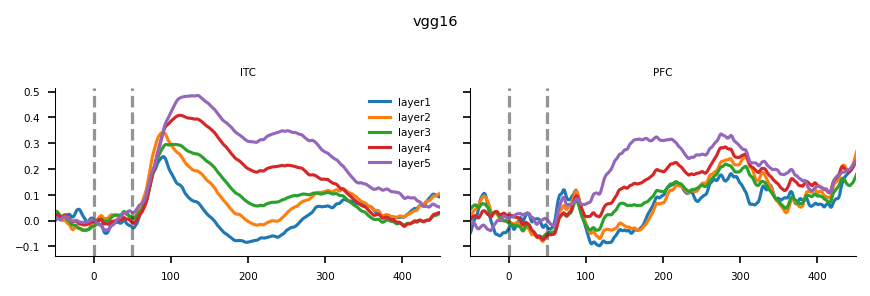

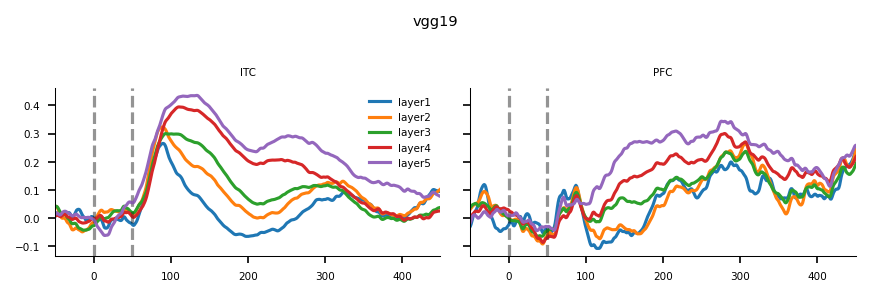

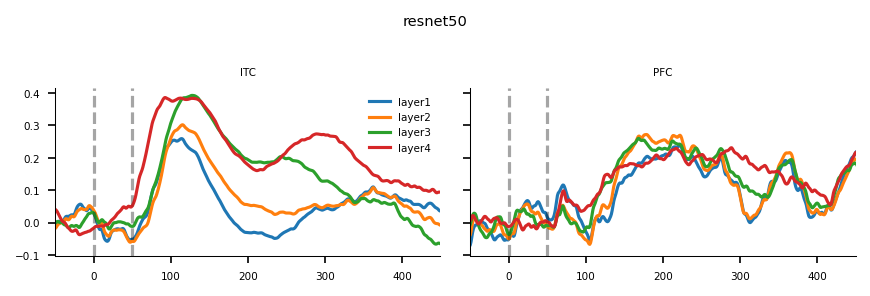

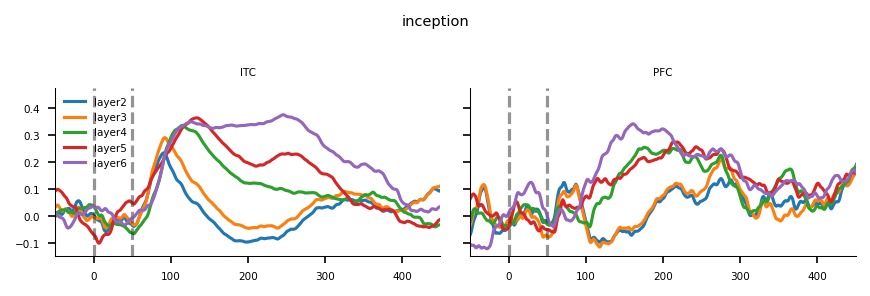

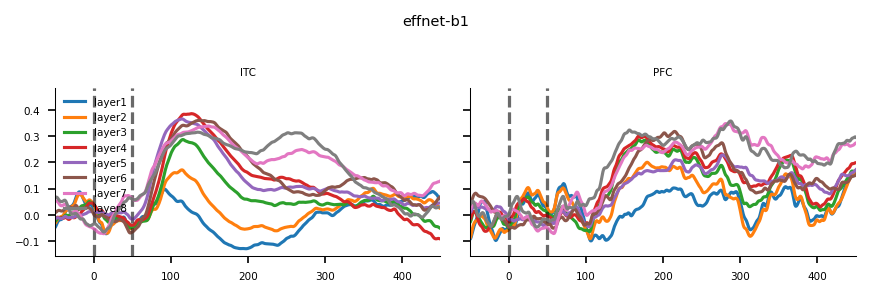

...

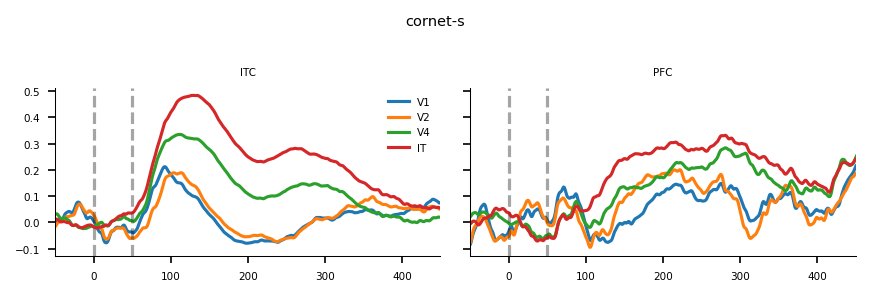

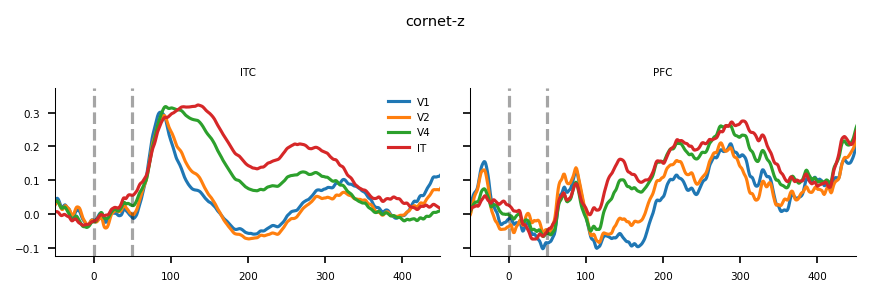

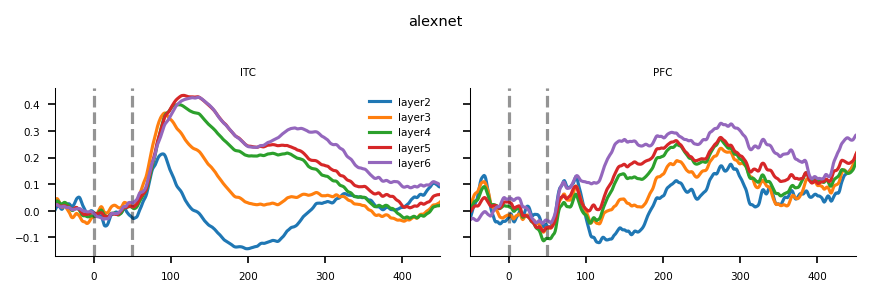

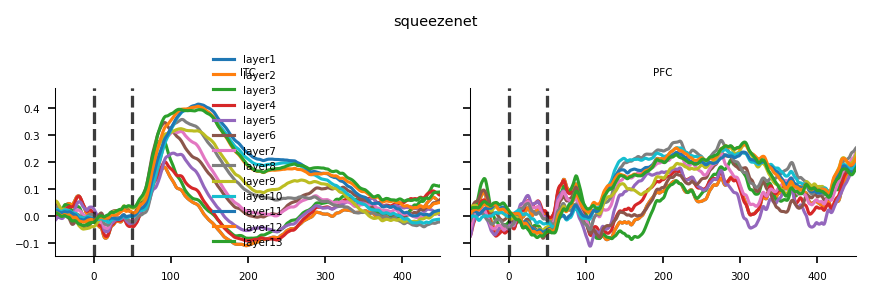

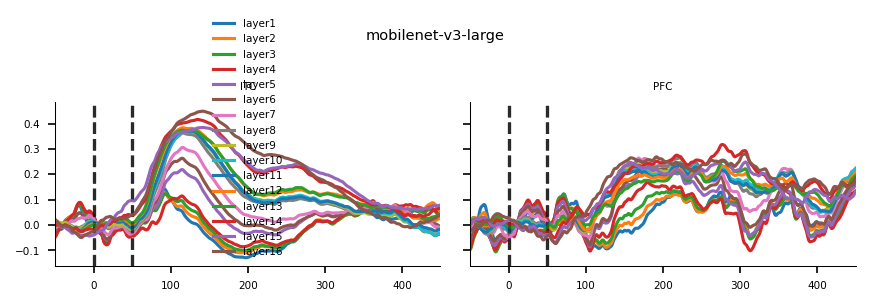

In [69]:
cm = 1 / 2.54
metric = 'spearman'

for model in all_models:
    with open(f'{model}-{metric}.pkl', 'rb') as f:
        corr = pickle.load(f)
    layers = [x for x in corr['itc'].keys() if x[-4:] != "null"]
    
    fig, axs = plt.subplots(1, 2, figsize=(15 * cm , 5 * cm), dpi=150, sharey=True)

    tim = np.arange(-200, 650) + 25

    for ax, region, sig in zip(axs.flat, ['itc', 'pfc'], [1.5, 1.5]):
        for layer in layers:
            if metric == 'pearson':
                c = corr[region][layer] - corr[region][layer+"-null"].mean(0)
            else:
                c = corr[region][layer]
            Z = smooth((c), sigma=sig)
            Z -= Z[(tim<50) & (tim>-50)].mean()
            
            h = ax.plot(tim, Z, label=layer)
            
            ax.axvline(0, c='k', ls='--', alpha=.1)
            ax.axvline(50, c='k', ls='--', alpha=.1)
            ax.set_xlim(-50, 450)
            ax.set_title(region.upper(), fontsize=5)

            ax.tick_params(axis='both', which='major', labelsize=5)
            plt.setp(ax.spines.values(), linewidth=.5)

    axs[0].legend(fontsize=5, frameon=False)
    sns.despine()
    plt.suptitle(model, fontsize=7)
    fig.tight_layout()

# ANN Summary

In [6]:
metric = 'spearman'

all_models = ['vgg16', 'vgg19', 'resnet50', 'inception', 'effnet-b1', 'densenet201', 
              'cornet-rt', 'cornet-s', 'cornet-z', 'alexnet', 'squeezenet', 'mobilenet-v3-large']
# all_models = ['vgg16', 'vgg19', 'inception', 'effnet-b1', 'densenet201', 
#               'cornet-rt', 'cornet-s', 'cornet-z', 'alexnet', 'squeezenet', 'mobilenet-v3-large']

corrs = {}
for model in all_models:
    with open(f'{model}-{metric}.pkl', 'rb') as f:
        corr = pickle.load(f)
    layers = [x for x in corr['itc'].keys() if x[-4:] != "null"]

    corrs[model] = {'corr': corr, 'layers': layers}

In [7]:
last_layer_correlations = {'itc': [], 'pfc': []}

for key in corrs.keys():
    last_layer_correlations['itc'].append(corrs[key]['corr']['itc'][corrs[key]['layers'][-1]])
    last_layer_correlations['pfc'].append(corrs[key]['corr']['pfc'][corrs[key]['layers'][-1]])

last_layer_correlations['itc'] = np.array(last_layer_correlations['itc'])
last_layer_correlations['pfc'] = np.array(last_layer_correlations['pfc'])

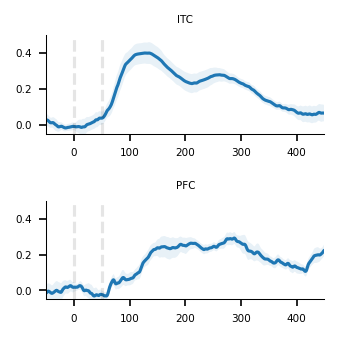

In [8]:
cm = 1 / 2.54
metric = 'spearman'

sns.set_palette("tab10")

fig, axs = plt.subplots(2, 1, figsize=(6 * cm , 6 * cm), dpi=150, sharey=True)

tim = np.arange(-200, 650) + 25

for ax, region, sig in zip(axs.flat, ['itc', 'pfc'], [1.5, 1.5]):
    c = last_layer_correlations[region]
    Z = smooth((c.mean(0)), sigma=sig)
    Z -= Z[(tim<50) & (tim>-50)].mean()

    W = smooth(c.std(0), sigma=sig)


    # for layer in layers:
    #     if metric == 'pearson':
    #         c = corr[region][layer] - corr[region][layer+"-null"].mean(0)
    #     else:
    #         c = corr[region][layer]
        
    h = ax.plot(tim, Z)
    ax.fill_between(tim, Z + W, Z - W, alpha=.1)
        
    ax.axvline(0, c='k', ls='--', alpha=.1)
    ax.axvline(50, c='k', ls='--', alpha=.1)
    ax.set_xlim(-50, 450)
    ax.set_title(region.upper(), fontsize=5)

    ax.tick_params(axis='both', which='major', labelsize=5)
    plt.setp(ax.spines.values(), linewidth=.5)

axs[0].set_ylim(-0.05, .5)
# axs[0].legend(fontsize=5, frameon=False)
sns.despine()
# plt.suptitle(model, fontsize=7)
fig.tight_layout()

plt.savefig('correlation-time-series.pdf')

In [9]:
tt_cor = {}
for key1 in ['itc', 'pfc']:
    for key2 in ['itc', 'pfc']:
        
        X1 = last_layer_correlations[key1]
        X2 = last_layer_correlations[key2]

        c = []
        for i_time in tqdm(range(X1.shape[1])):
            c_ = []
            for j_time in range(X2.shape[1]):
                c_.append(r(X1[:, i_time], X2[:, j_time]))
            c.append(c_)
        
        c = np.array(c)
        tt_cor[key1+"-"+key2] = c

with open("tt-cor.pkl", 'wb') as f:
    pickle.dump(tt_cor, f)


  0%|          | 0/850 [00:00<?, ?it/s]

  0%|          | 0/850 [00:00<?, ?it/s]

  0%|          | 0/850 [00:00<?, ?it/s]

  0%|          | 0/850 [00:00<?, ?it/s]

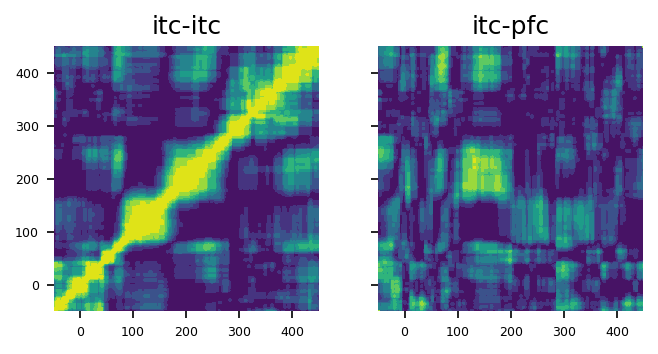

In [11]:
mm = 1 / 25.6
fig, axes = plt.subplots(1, 2, figsize=(120 * mm, 60 * mm), dpi=150, sharey=True, sharex=True, squeeze=False)

cmap = 'viridis'

tim = np.arange(-200, 650) + 12.5
# tim = tim[::-1]
timind = ((tim < 450) & (tim > -50)).flatten()

for ind, (ax, key) in enumerate(zip(axes.flat, ['itc-itc', 'itc-pfc'])):
    X = tt_cor[key][timind][:, timind][:, :, 0]
    Y = tt_cor[key][timind][:, timind][:, :, 1]
    X[0,0]=-1
    X[-1,-1]=1
    X = X ** 2

    cnt = ax.contourf(tim[timind], tim[timind], X, levels=10, cmap=cmap)
    # ax.contour(tim[timind], tim[timind], Y, levels = [0.05], colors=['m'], linewidths=1)
    for c in cnt.collections:
        c.set_edgecolor("face")
    ax.set_title(key)

    plt.setp(ax.spines.values(), linewidth=0)
    ax.set_xlim(-50, 600)
    ax.tick_params(axis='both', which='major', labelsize=6)
    # ax.set_yticks(ax.get_xticks())

    ax.axis('square')

    if ind == 2:
        ax.axis('off')

fig.tight_layout()

plt.savefig('correlation-time-time.pdf')

In [12]:
import pandas as pd

tim = np.arange(-200, 650) + 25

tmp = []
for model in corrs.keys():
    m = corrs[model]
    ll = m['layers'][-1]
    x = m['corr']['itc'][ll]
    y = m['corr']['pfc'][ll]

    tmp.append([x[(tim < 170) & (tim >= 70)].mean(), 
                x[(tim < 250) & (tim >= 170)].mean(),
                y[(tim < 250) & (tim >= 170)].mean()])
tmp = np.array(tmp)

df1 = pd.DataFrame({'correlations': tmp.flatten(),
                   'model': np.tile(np.array(list(corrs.keys())).reshape(-1, 1), [1, 3]).flatten(),
                   'window': np.tile(np.array(['i1', 'i2', 'p1']).reshape(1, -1), [len(corrs.keys()), 1]).flatten()})
df2 = pd.DataFrame({'model': corrs.keys(),
                   'i1': tmp[:, 0],
                   'i2': tmp[:, 1],
                   'p1': tmp[:, 2]})

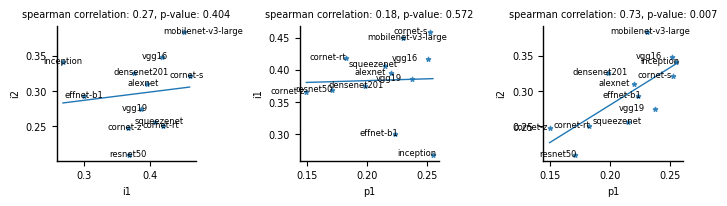

In [16]:
sns.set_palette('tab10')

fig, axes = plt.subplots(1, 3, figsize=(18 * cm, 5.5*cm), dpi=100)

for ax, (p1, p2) in zip(axes, zip(['i1', 'p1', 'p1'], ['i2', 'i1', 'i2'])):

    sct = sns.regplot(data=df2, x=p1, y=p2, ax=ax, marker='*', ci=None,
                        scatter_kws={'s': 10}, line_kws={'lw': 1})
    for iPoint in range(len(df2)):
        ax.text(df2[p1][iPoint]-.03, df2[p2][iPoint]-0.002, df2['model'][iPoint], fontsize=6)

    c, p = r(df2[p1], df2[p2])
    ax.set_title(f"spearman correlation: {c:0.2f}, p-value: {p:0.3f}", fontsize=7)

for ax in axes:
    ax.set_xlabel(ax.get_xlabel(), fontsize=7)
    ax.set_ylabel(ax.get_ylabel(), fontsize=7)
    ax.tick_params(axis='both', which='major', labelsize=7)
    plt.setp(ax.spines.values(), linewidth=1)

sns.despine()
fig.tight_layout()

plt.savefig('correlation-scatter.pdf')

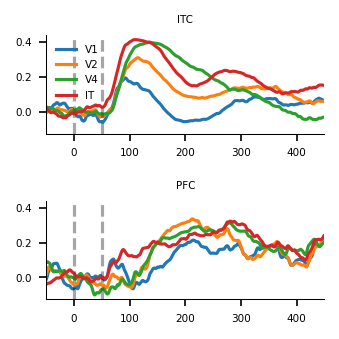

In [17]:
cm = 1 / 2.54
metric = 'spearman'

model = 'cornet-rt'

with open(f'{model}-{metric}.pkl', 'rb') as f:
    corr = pickle.load(f)
layers = [x for x in corr['itc'].keys() if x[-4:] != "null"]

fig, axs = plt.subplots(2, 1, figsize=(6 * cm , 6 * cm), dpi=150, sharey=True)

tim = np.arange(-200, 650) + 25

for ax, region, sig in zip(axs.flat, ['itc', 'pfc'], [1.5, 1.5]):
    for layer in layers:
        if metric == 'pearson':
            c = corr[region][layer] - corr[region][layer+"-null"].mean(0)
        else:
            c = corr[region][layer]
        Z = smooth((c), sigma=sig)
        Z -= Z[(tim<50) & (tim>-50)].mean()
        
        h = ax.plot(tim, Z, label=layer)
        
        ax.axvline(0, c='k', ls='--', alpha=.1)
        ax.axvline(50, c='k', ls='--', alpha=.1)
        ax.set_xlim(-50, 450)
        ax.set_title(region.upper(), fontsize=5)

        ax.tick_params(axis='both', which='major', labelsize=5)
        plt.setp(ax.spines.values(), linewidth=.5)

axs[0].legend(fontsize=5, frameon=False)
sns.despine()
# plt.suptitle(model, fontsize=7)
fig.tight_layout()

plt.savefig('correlation-time-series-cornet.pdf')

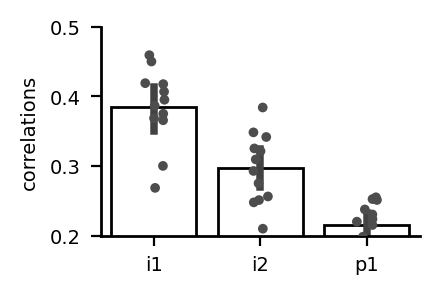

In [18]:
cm = 1 / 2.54
fig, ax = plt.subplots(1, 1, figsize=(6 * cm, 4*cm), dpi=200)

sns.barplot(data=df1, x='window', y='correlations', ax=ax, facecolor=(0,0,0,0), edgecolor='0')
sns.stripplot(data=df1, x='window', y='correlations', ax=ax, color='.3', size=3.5)

ax.set_xlabel("")
ax.set_ylabel(ax.get_ylabel(), fontsize=7)
ax.tick_params(axis='both', which='major', labelsize=7)
ax.set_ylim(0.2, 0.5)
plt.setp(ax.spines.values(), linewidth=1)
sns.despine()

fig.tight_layout()

# plt.savefig('correlation-barplot.pdf')

In [23]:
attr = {}
for layer in ['V1', 'V2', 'V4', 'IT']:
    repr = np.load(f'../cornet/CORnet-Z_{layer}_output_feats.npy')
    attr[layer] = repr[:165, :]

with open('cornet-z-attr.pkl', 'wb') as f:
    pickle.dump(attr, f)